In [1]:
import pandas as pd
import scutquant.scutquant as q

df = pd.read_csv("D:/Desktop/data.csv")
df["datetime"] = pd.to_datetime(df["datetime"])
df["mean_price"] = df["amount"] / df["vol"] * 10  # 每支股票在当天的交易均价
df

,datetime,ts_code,open,high,low,close,pre_close,change,pct_chg,vol,amount,mean_price
0,2006-01-04,000001.SZ,6.13,6.33,6.12,6.28,6.14,0.14,2.2800,154450.68,96989.0066,6.279610
1,2006-01-04,000002.SZ,4.40,4.67,4.40,4.66,4.31,0.35,8.1200,389310.43,175187.0657,4.499933
2,2006-01-04,000012.SZ,4.70,4.75,4.55,4.70,4.62,0.08,1.7300,40399.61,18863.8625,4.669318
3,2006-01-04,000016.SZ,3.52,3.58,3.52,3.57,3.52,0.05,1.4200,14426.65,5131.8793,3.557222
4,2006-01-04,000021.SZ,7.99,8.40,7.99,8.32,8.00,0.32,4.0000,33526.60,27657.1708,8.249322
...,...,...,...,...,...,...,...,...,...,...,...,...
1199440,2022-12-30,688363.SH,136.00,137.00,131.50,135.28,135.49,-0.21,-0.1550,29951.60,401624.1560,134.091052
1199441,2022-12-30,688396.SH,53.06,53.40,52.49,52.65,52.87,-0.22,-0.4161,23401.54,123568.2880,52.803486
1199442,2022-12-30,688561.SH,65.49,67.88,64.85,65.77,65.46,0.31,0.4736,22567.89,149379.0770,66.190981
1199443,2022-12-30,688599.SH,63.31,64.56,62.31,63.76,63.20,0.56,0.8861,109144.36,695759.9350,63.746760


In [2]:
df.set_index(["datetime", "ts_code"], inplace=True)
df.index.names = ["datetime", "instrument"]

interest_data = pd.read_csv("D:/Desktop/capm.csv")
interest_data["RF"] = interest_data["RF"].shift(1).fillna(method="bfill")

print("Joining data, please wait...")
df = q.join_data(df, interest_data, col=["RF", "MKT"])

print("Making i factors...")
df["i"] = df["pct_chg"] / df["RF"]  # 昨天的RF对今天的pct_chg的影响

print(df["open"].groupby("datetime").count())
df.info()

Joining data, please wait...
Making i factors...
datetime
2006-01-04    264
2006-01-05    267
2006-01-06    272
2006-01-09    269
2006-01-10    267
             ... 
2022-12-26    300
2022-12-27    300
2022-12-28    300
2022-12-29    300
2022-12-30    300
Name: open, Length: 4132, dtype: int64
<class 'pandas.core.frame.DataFrame'>
MultiIndex: 1199445 entries, (Timestamp('2006-01-04 00:00:00'), '000001.SZ') to (Timestamp('2022-12-30 00:00:00'), '688981.SH')
Data columns (total 13 columns):
 #   Column      Non-Null Count    Dtype  
---  ------      --------------    -----  
 0   open        1199445 non-null  float64
 1   high        1199445 non-null  float64
 2   low         1199445 non-null  float64
 3   close       1199445 non-null  float64
 4   pre_close   1199445 non-null  float64
 5   change      1199445 non-null  float64
 6   pct_chg     1199445 non-null  float64
 7   vol         1199445 non-null  float64
 8   amount      1199445 non-null  float64
 9   mean_price  1199445 non-null

构建目标值，使用pct$\_$chg(即收盘价的变化率)的滞后-2阶项(相当于T+2对T+1的收盘价变化率)除以100 作为目标值，并按照涨跌停限制(-10$\%$, 10$\%$)截断

In [3]:
df["label"] = df["pct_chg"].groupby("instrument").shift(-2) / 100
df = df.dropna()
df["label"].clip(-0.1, 0.1, inplace=True) 
df["label"].describe()

count    1.197673e+06
mean     5.829445e-04
std      2.843395e-02
min     -1.000000e-01
25%     -1.330000e-02
50%      0.000000e+00
75%      1.370000e-02
max      1.000000e-01
Name: label, dtype: float64

查看原始数据之间的相关关系, 发现利率因子的相关系数(pearson相关系数和spearman相关系数)比较高

In [4]:
df = df.drop(["pct_chg", "change", "pre_close"], axis=1)
df.corr()

,open,high,low,close,vol,amount,mean_price,RF,MKT,i,label
open,1.000000,0.999825,0.999831,0.999663,-0.074657,0.277427,0.999812,0.020241,-0.001763,0.000398,-0.005175
high,0.999825,1.000000,0.999769,0.999862,-0.074264,0.279842,0.999930,0.020714,-0.001834,0.005715,-0.005246
low,0.999831,0.999769,1.000000,0.999838,-0.074679,0.275917,0.999923,0.019794,-0.001883,0.004937,-0.005177
close,0.999663,0.999862,0.999838,1.000000,-0.074348,0.278155,0.999946,0.020241,-0.001957,0.010109,-0.005471
vol,-0.074657,-0.074264,-0.074679,-0.074348,1.000000,0.607239,-0.074416,-0.045703,-0.006609,0.076687,-0.000709
amount,0.277427,0.279842,0.275917,0.278155,0.607239,1.000000,0.278044,-0.043119,-0.007660,0.084353,-0.008528
mean_price,0.999812,0.999930,0.999923,0.999946,-0.074416,0.278044,1.000000,0.020227,-0.001879,0.006768,-0.005219
RF,0.020241,0.020714,0.019794,0.020241,-0.045703,-0.043119,0.020227,1.000000,-0.017826,0.001253,0.025623
MKT,-0.001763,-0.001834,-0.001883,-0.001957,-0.006609,-0.007660,-0.001879,-0.017826,1.000000,-0.019636,0.002200
i,0.000398,0.005715,0.004937,0.010109,0.076687,0.084353,0.006768,0.001253,-0.019636,1.000000,-0.015204


In [5]:
df.corr(method="spearman")

,open,high,low,close,vol,amount,mean_price,RF,MKT,i,label
open,1.000000,0.999726,0.999759,0.999502,-0.299444,0.381984,0.999765,-0.015008,0.013022,-0.006741,-0.015185
high,0.999726,1.000000,0.999611,0.999773,-0.295026,0.386481,0.999903,-0.012186,0.012625,0.006444,-0.015217
low,0.999759,0.999611,1.000000,0.999732,-0.300672,0.380781,0.999864,-0.017793,0.012629,0.004583,-0.015581
close,0.999502,0.999773,0.999732,1.000000,-0.297030,0.384441,0.999890,-0.014675,0.012326,0.017296,-0.016174
vol,-0.299444,-0.295026,-0.300672,-0.297030,1.000000,0.722123,-0.297402,-0.086616,-0.013549,0.078427,-0.007272
amount,0.381984,0.386481,0.380781,0.384441,0.722123,1.000000,0.384138,-0.067930,-0.006266,0.083054,-0.017903
mean_price,0.999765,0.999903,0.999864,0.999890,-0.297402,0.384138,1.000000,-0.014826,0.012562,0.008566,-0.015425
RF,-0.015008,-0.012186,-0.017793,-0.014675,-0.086616,-0.067930,-0.014826,1.000000,-0.009827,0.015269,0.015334
MKT,0.013022,0.012625,0.012629,0.012326,-0.013549,-0.006266,0.012562,-0.009827,1.000000,-0.023661,0.000779
i,-0.006741,0.006444,0.004583,0.017296,0.078427,0.083054,0.008566,0.015269,-0.023661,1.000000,-0.031948


使用label在截面上的平均值构建等权指数，查看股票在时序上的总体变化

<AxesSubplot:xlabel='datetime'>

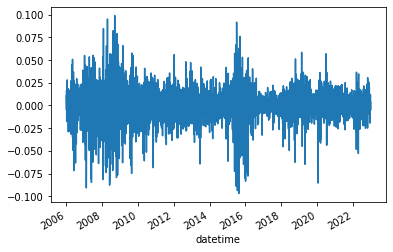

In [6]:
index = pd.DataFrame({"index": df["label"].groupby("datetime").mean()})
index["index"].plot()

In [7]:
index["index"].describe()

count    4130.000000
mean        0.000607
std         0.018247
min        -0.096926
25%        -0.007113
50%         0.000959
75%         0.009797
max         0.098993
Name: index, dtype: float64

对指数进行时间序列分析，结果表明收益率可能存在一定的自相关性(周期性), 但趋势和季节性不明显

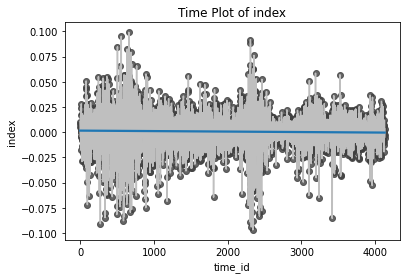

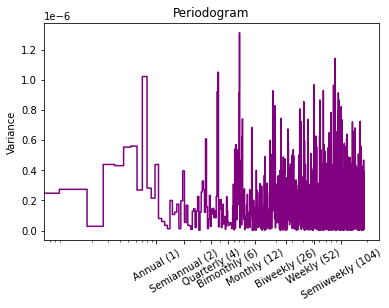

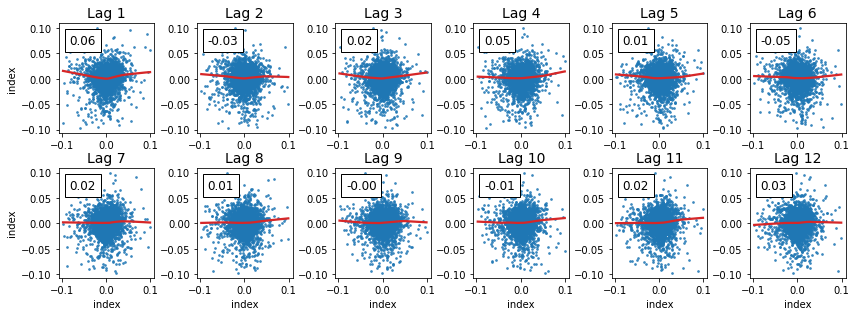

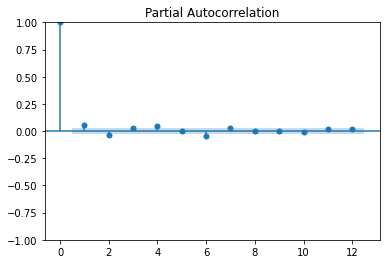

In [8]:
index = pd.DataFrame({"index": df["label"].groupby("datetime").mean()})
q.auto_ts_ana(index, "index", "day", windows=5, lags=12)

使用alpha模块构建因子 (make_factors是构建技术面因子；alpha360是原始数据的滞后项去除单位)

In [9]:
from scutquant import alpha

kwargs = {
    "data": df,
    "open": "open",
    "close": "close",
    "high": "high",
    "low": "low",
    "volume": "vol",
    "amount": "amount",
    "groupby": "instrument"
}
X = alpha.alpha360(kwargs=kwargs)
#X = alpha.make_factors(kwargs=kwargs, raw_data=0)
X = pd.concat([X, df[["label", "i"]]], axis=1)
for i in range(1, 7):
    X["label" + str(i)] = X["label"].groupby("instrument").shift(i)
"""
for i in range(0, 60):
    X["mean" + str(i)] = df["mean_price"].groupby("instrument").shift(i) / df["close"]
"""
X = X.dropna()
X

open1     open2     open3     open4     open5  \
datetime   instrument                                                     
2006-04-07 000001.SZ   1.024730  1.015456  0.990726  0.976816  0.973725   
           000002.SZ   1.023426  0.995608  1.010249  0.959004  0.951684   
           000059.SZ   0.955711  0.960373  0.958042  0.930070  0.923077   
           000061.SZ   0.876122  0.829443  0.829443  0.800718  0.804309   
           000063.SZ   1.013342  0.987929  1.012706  0.972363  0.959339   
...                         ...       ...       ...       ...       ...   
2022-12-28 688363.SH   0.963159  0.955070  0.951026  0.914111  0.904552   
           688396.SH   0.999434  0.990377  1.000000  1.015094  1.023019   
           688561.SH   1.024219  1.031379  0.938157  0.938309  0.941356   
           688599.SH   0.942443  0.863839  0.873565  0.858099  0.874043   
           688981.SH   1.011980  1.000000  1.000000  1.015892  1.020293   

                          open6     open7     open8     open9    open10  ...  \
datetime   instrument                                                    ...   
2006-04-07 000001.SZ   1.003091  0.989181  0.981453  0.975270  0.989181  ...   
           000002.SZ   0.966325  0.959004  0.913616  0.868228  0.878477  ...   
           000059.SZ   0.932401  0.951049  0.953380  0.934732  0.946387  ...   
           000061.SZ   0.825853  0.798923  0.771993  0.777379  0.789946  ...   
           000063.SZ   0.945044  0.930432  0.932338  0.927573  0.921220  ...   
...                         ...       ...       ...       ...       ...  ...   
2022-12-28 688363.SH   0.919921  0.941246  0.932642  0.956688  0.919185  ...   
           688396.SH   1.024717  1.074528  1.065660  1.068679  1.107547  ...   
           688561.SH   0.974867  0.982635  1.002285  0.990251  0.967251  ...   
           688599.SH   0.882175  0.872449  0.883291  0.876276  0.893973  ...   
           688981.SH   1.016626  1.046455  1.039120  1.038142  1.074817  ...   

                       amount59  amount60     label             i    label1  \
datetime   instrument                                                         
2006-04-07 000001.SZ   0.125080  0.125308  0.026700  -4230.769231  0.041700   
           000002.SZ   0.054714  0.049890  0.025300 -11043.956044 -0.017600   
           000059.SZ   0.058425  0.019139 -0.020700  17197.802198  0.011700   
           000061.SZ   0.020071  0.046194 -0.001800  20439.560440 -0.001800   
           000063.SZ   0.046420  0.059121 -0.007900 -21318.681319 -0.030200   
...                         ...       ...       ...           ...       ...   
2022-12-28 688363.SH   0.042411  0.042831 -0.001550  -9662.666667 -0.003677   
           688396.SH   0.158856  0.164713 -0.004161  -9180.000000 -0.002453   
           688561.SH   0.081799  0.104741  0.004736 -14309.333333 -0.002894   
           688599.SH   0.057827  0.057153  0.008861  26640.000000  0.007653   
           688981.SH   0.100307  0.087161  0.006114  -9322.000000 -0.000244   

                         label2    label3    label4    label5    label6  
datetime   instrument                                                    
2006-04-07 000001.SZ  -0.007700 -0.012100  0.004600  0.025000  0.006300  
           000002.SZ  -0.020100 -0.001400  0.026500 -0.013100  0.051900  
           000059.SZ   0.031300  0.014600 -0.004900  0.002400  0.035300  
           000061.SZ   0.037200  0.100000  0.056300  0.000000  0.031300  
           000063.SZ  -0.038800  0.026600  0.017200 -0.017200  0.041800  
...                         ...       ...       ...       ...       ...  
2022-12-28 688363.SH  -0.014494  0.061952  0.000847 -0.006580  0.052254  
           688396.SH  -0.013770  0.014537  0.009145 -0.021622 -0.002232  
           688561.SH  -0.021464 -0.009157  0.008189  0.078010  0.011364  
           688599.SH   0.039960  0.016004  0.100000 -0.027432  0.032805  
           688981.SH  -0.013983  0.001207  0.009011 -0.000243 -0.005328  

[1144849 rows x 36

划分训练集，验证集和测试集(测试集时间为2019年1月1月-2022年12月28日), 训练集和验证集在剩余数据中按7:3的比例随机拆分；  
分离因子和目标值；  
对因子(和目标值)按截面分别进行标准化处理(ZScoreNorm)，并使用三倍标准差法截断异常值；  
按照股票代码，使用ffill方法填充因子缺失值，并去除剩余缺失值；并使目标值的index与因子相匹配

注: 由于直接对目标值按截面进行标准化可能在回测时引起数据窥探，故对目标值进行标准化时，使用滞后2阶的均值和标准差, 并以年化5$\%$和年化30$\%$填充缺失值

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 863009 entries, (Timestamp('2006-04-07 00:00:00'), '000001.SZ') to (Timestamp('2018-12-28 00:00:00'), '603993.SH')
Columns: 368 entries, open1 to label6
dtypes: float64(368)
memory usage: 2.4+ GB
None
X_mis= 0.0
clean dataset done 

split data done 

label norm done 



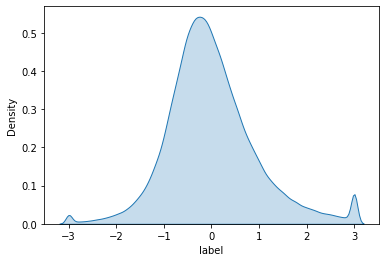

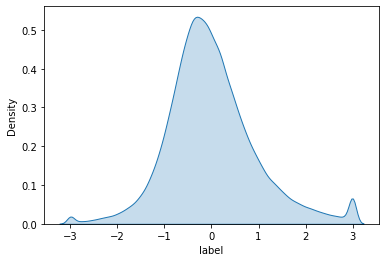

norm data done 

all works done 



In [10]:
X_train = X[X.index.get_level_values(0) <= "2018-12-31"]
X_test = X[X.index.get_level_values(0) >= "2019-01-01"]

# 处理训练集和验证集
result = q.auto_process(X_train, "label", groupby="instrument", datetime="datetime", 
                        split_params={"method": "split", "params": {"test": 0.3}}, select=False, orth=False)

X_train, y_train, X_valid, y_valid = result["X_train"], result["y_train"], result["X_test"], result["y_test"]

# 处理测试集
y_test = X_test.pop("label")
x_mean, x_std = X_test.groupby("datetime").mean(), X_test.groupby("datetime").std()
X_test = q.zscorenorm(X_test, x_mean, x_std)

y_mean = y_test.groupby("instrument").shift(2).groupby("datetime").mean()
y_std = y_test.groupby("instrument").shift(2).groupby("datetime").std()
y_mean.fillna(0.0002, inplace=True)  # 假设年化5%, 则每天应为0.0002
y_std.fillna(0.0189, inplace=True)  # 假设年化波动率为30%, 即0.3, 则每天的波动率应为0.0189

X_test = X_test.groupby("instrument").fillna(method="ffill").dropna()
y_test = y_test[y_test.index.isin(X_test.index)]

查看X_train的分布

In [11]:
X_train.describe()

,open1,open2,open3,open4,open5,open6,open7,open8,open9,open10,...,amount58,amount59,amount60,i,label1,label2,label3,label4,label5,label6
count,604106.000000,604106.000000,604106.000000,604106.000000,604106.000000,604106.000000,604106.000000,604106.000000,604106.000000,604106.000000,...,604106.000000,604106.000000,604106.000000,604106.000000,604106.000000,604106.000000,604106.000000,604106.000000,604106.000000,604106.000000
mean,-0.001886,-0.006017,-0.008671,-0.010522,-0.012149,-0.013371,-0.014311,-0.015032,-0.015638,-0.016248,...,-0.029140,-0.029197,-0.029305,-0.008024,-0.007972,-0.008143,-0.007887,-0.007602,-0.007429,-0.007182
std,0.922246,0.903282,0.890462,0.883067,0.877944,0.873692,0.871871,0.871285,0.870522,0.869565,...,0.844120,0.843787,0.842986,0.941648,0.943144,0.942856,0.942617,0.942664,0.943282,0.943449
min,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,...,-2.027422,-1.892921,-1.852144,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000
25%,-0.477078,-0.466828,-0.463300,-0.460420,-0.461849,-0.461600,-0.463968,-0.467283,-0.469881,-0.471297,...,-0.586800,-0.584746,-0.585379,-0.585882,-0.585898,-0.587103,-0.584014,-0.582059,-0.580646,-0.579683
50%,0.044340,0.029382,0.022633,0.015661,0.009684,0.005715,0.001505,-0.002910,-0.005429,-0.009716,...,-0.229956,-0.230185,-0.230280,-0.108630,-0.109044,-0.108972,-0.107573,-0.105817,-0.104343,-0.100653
75%,0.539813,0.508523,0.489593,0.478851,0.469578,0.463673,0.459752,0.456898,0.453732,0.451162,...,0.271687,0.269739,0.271020,0.470166,0.469364,0.471389,0.469643,0.471833,0.471976,0.473381
max,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,...,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000


下面进行特征分析，每一列子图有四行，含义分别为:  

(1) 特征整体的分布  
(2) 随着时间变化，特征的均值和方差  
(3) 随着时间变化，特征每天的 unique value占当天总股票数量的比例（用于统计特征是数值特征还是类别特征）  
(4) 特征的自相关性 (1 lag)

结论:    
(1)随着滞后阶数的提升, 特征的自相关性变高  
(2)除了label特征外，其余特征均为数值特征(unique value占比都较高)  
(3)随着时间变化，label特征在categorical feature和numerical feature之间变化  
(4)特征处理可以改进(目前特征均值和方差随时间变化比较剧烈)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    9.3s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    9.9s
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:   13.4s
[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed:   16.6s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:   18.7s
[Parallel(n_jobs=-1)]: Done  81 tasks      | elapsed:   21.4s
[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:   24.5s
[Parallel(n_jobs=-1)]: Done 113 tasks      | elapsed:   28.0s
[Parallel(n_jobs=-1)]: Done 130 tasks      | elapsed:   31.7s
[Parallel(n_jobs=-1)]: Done 149 tasks      | elapsed:   35.7s
[Parallel(n_jobs=-1)]: Done 168 tasks      | elapsed:   40.9s
[Parallel(n_jobs=-1)]: Done 189 tasks      | elapsed:   44.9s
[Parallel(n_jobs=-1)]: Done 210 tasks      | elapsed:   49.2s
[Parallel(n_jobs=-1)]: Done 233 tasks      | elapsed:  

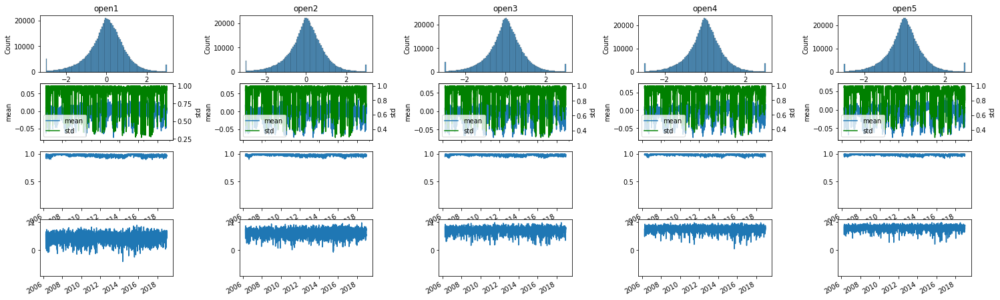

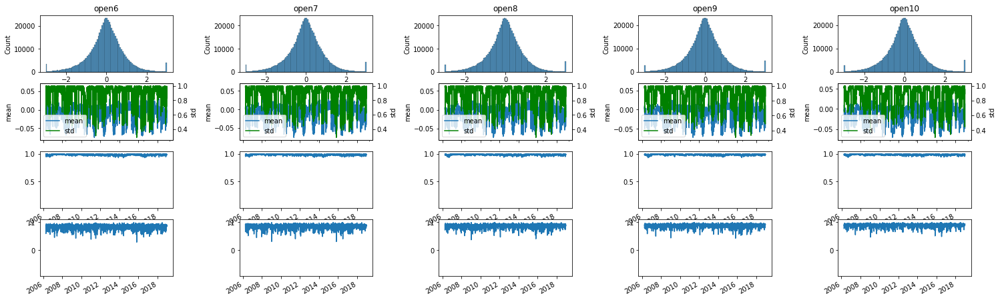

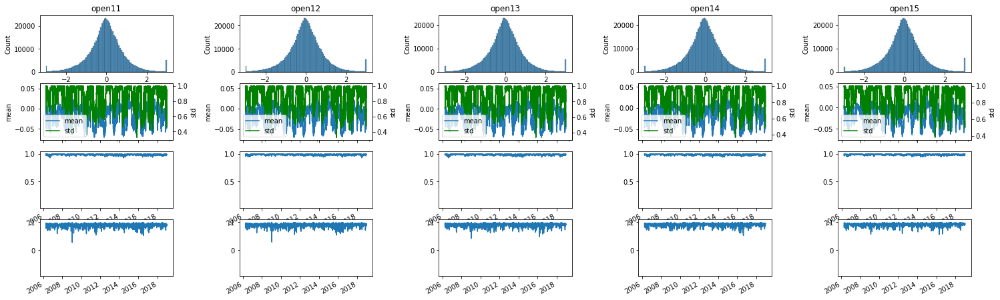

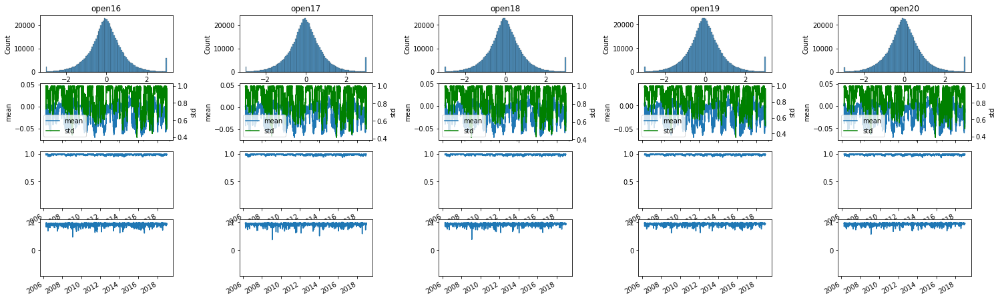

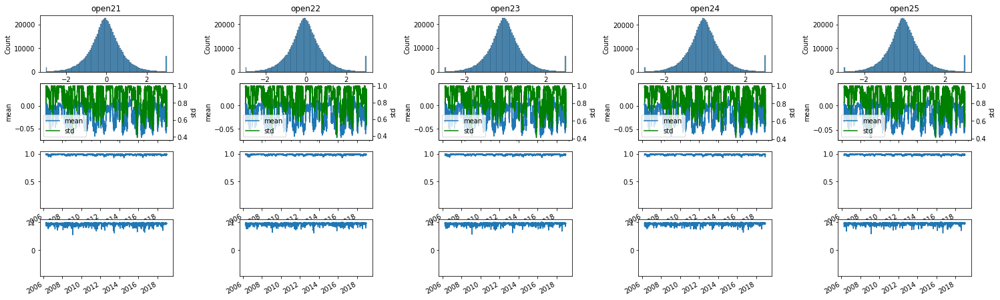

...

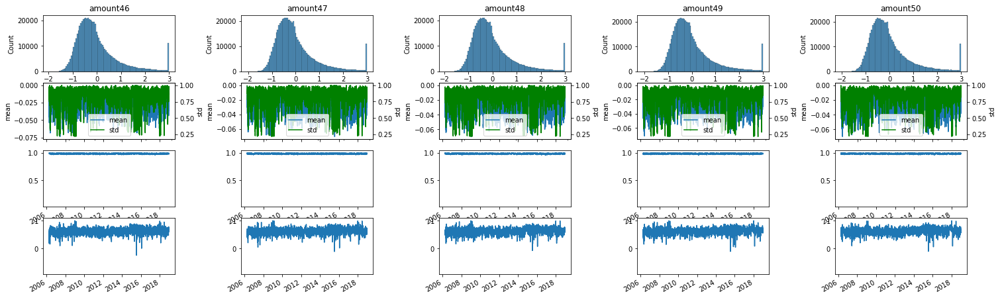

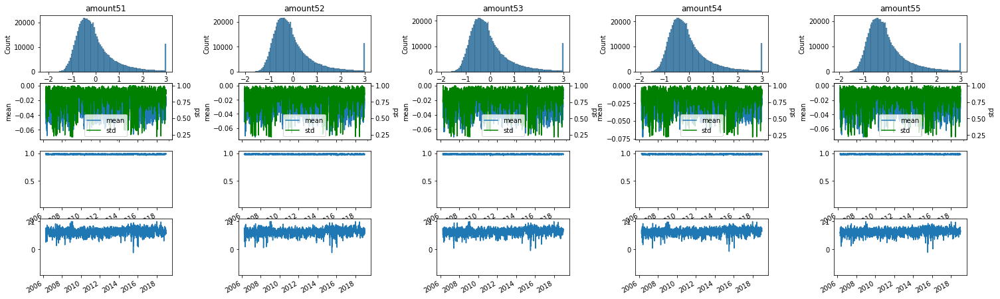

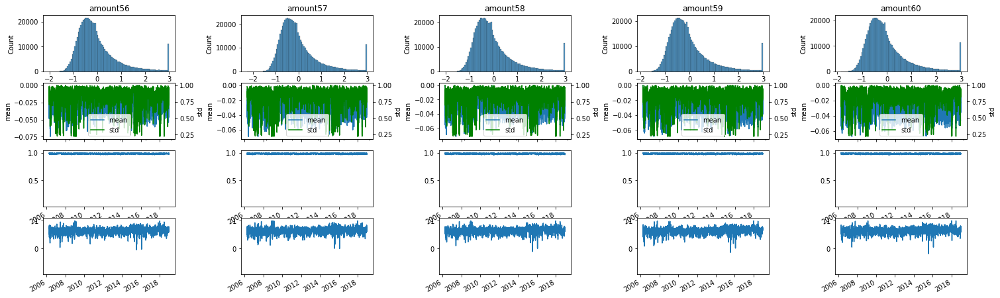

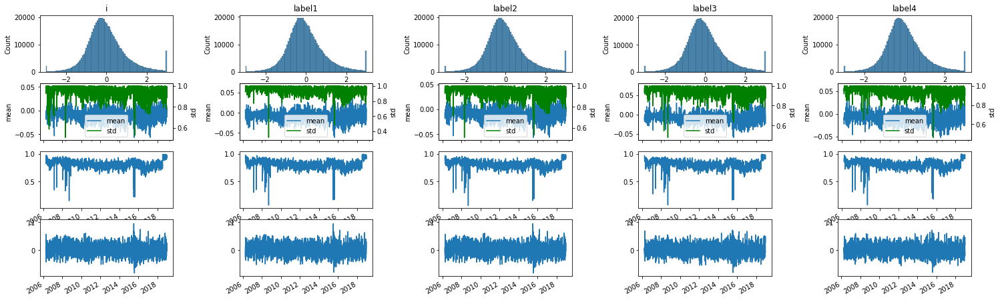

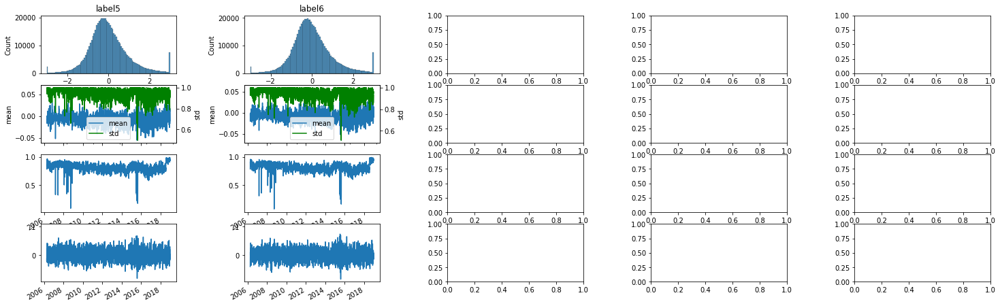

In [12]:
from functools import partial
from qlib.contrib.report.data.ana import CombFeaAna, FeaDistAna, FeaNanAnaRatio, FeaInfAna, FeaMeanStd, ValueCNT, FeaACAna, RawFeaAna

fa_full = CombFeaAna(X_train, FeaDistAna, FeaMeanStd, partial(ValueCNT, ratio=True), FeaACAna)
fa_full.plot_all(sub_fs=(5, 2), col_n=5, wspace=0.5)

因子性能分析: 下图统计了每个特征和Label和IC随时间如何变化 (moving average 100)  
因子性能随时间的变化非常剧烈(可能导致训练集、验证集和测试集上的结果有巨大差异)  
因子性能可能有周期性

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   12.2s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:   21.4s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:   22.1s
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:   31.3s
[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed:   40.6s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:   49.7s
[Parallel(n_jobs=-1)]: Done  81 tasks      | elapsed:   58.8s
[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 113 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 130 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 149 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 168 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 189 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 210 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 233 tasks      | elapsed:  

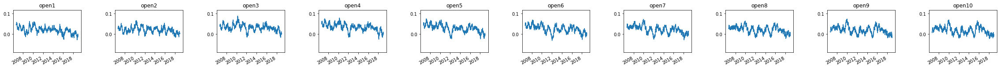

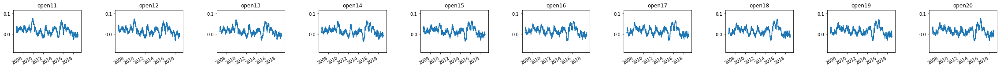

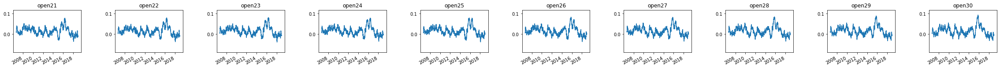

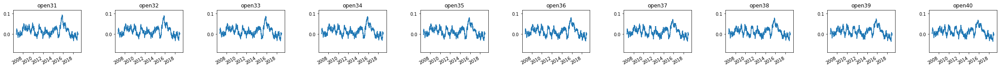

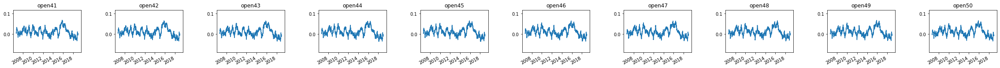

...

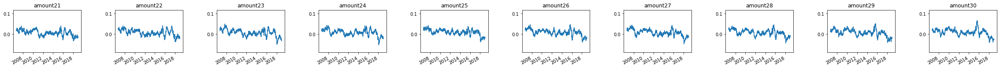

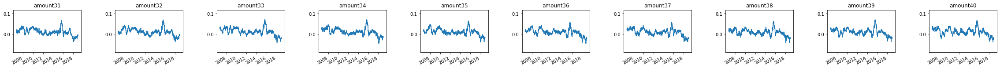

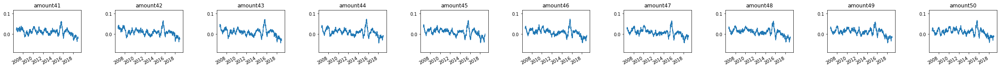

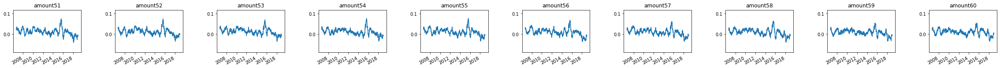

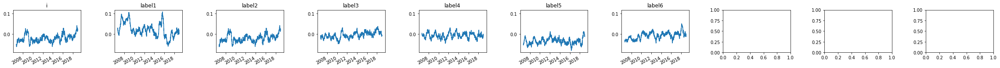

In [13]:
from qlib.contrib.eva.alpha import calc_all_ic
import pandas as pd

all_ic = calc_all_ic(X_train.to_dict('series'), y_train)
all_ic_df = pd.concat({f: d['ic'] for f, d in all_ic.items()})
all_ic_df = all_ic_df.unstack(0)

fa = RawFeaAna(all_ic_df.rolling(100).mean())
fa.plot_all(sub_fs=(4, 2), col_n=10, wspace=0.5)

<AxesSubplot:>

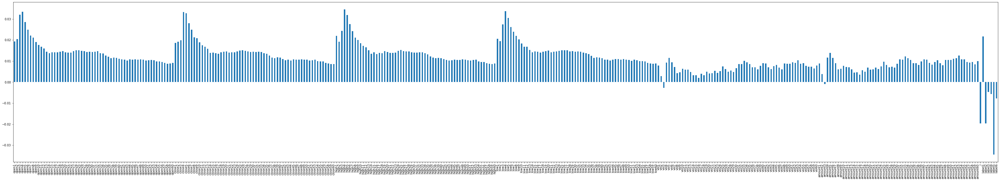

In [14]:
fig = all_ic_df.mean().plot(kind='bar', figsize=(60, 10))
fig

In [15]:
fig.figure.savefig("ic_mean")

原始数据的IC的均值，以及IC绝对值的均值

In [16]:
all_ic_df.mean().mean()

0.011724176700801812

In [17]:
abs(all_ic_df.mean()).mean()

0.012244258781897761

分别对y_train, y_valid和y_test进行描述统计，看其分布以及分布之间的差异

In [18]:
y_train.describe()

count    604106.000000
mean         -0.007870
std           0.942260
min          -3.000000
25%          -0.582046
50%          -0.106060
75%           0.469364
max           3.000000
Name: label, dtype: float64

In [19]:
y_valid.describe()

count    258903.000000
mean         -0.006713
std           0.949267
min          -3.000000
25%          -0.586940
50%          -0.104639
75%           0.476558
max           3.000000
Name: label, dtype: float64

In [20]:
y_test.describe()

count    281840.000000
mean          0.000463
std           0.024988
min          -0.100000
25%          -0.012383
50%           0.000000
75%           0.011458
max           0.100000
Name: label, dtype: float64

使用pickle保存处理好的数据

In [21]:
import pickle

df_test = df[df.index.get_level_values(0) >= "2019-01-01"]
data_to_dump = {
    "X_train": X_train,
    "X_valid": X_valid,
    "X_test": X_test,
    "y_train": y_train,
    "y_valid": y_valid,
    "y_test": y_test,
    "y_mean": y_mean,
    "y_std": y_std,
    "df_test": df_test
}
for k in data_to_dump.keys():
    file = open(k + ".pkl", "wb")
    pickle.dump(data_to_dump[k], file)
    file.close()

拟合一个简单的模型看看效果

In [22]:
# 拟合模型
model = q.auto_lrg(X_train, y_train,  method='ols')

pred = model.predict(X_test)

pred = pd.DataFrame(pred, columns=["predict"], index=X_test.index)
pred["predict"] += y_mean
pred["predict"] *= y_std
pred.describe()

ols method will be used


,predict
count,281840.000000
mean,-0.000149
std,0.001311
min,-0.027788
25%,-0.000853
50%,-0.000104
75%,0.000598
max,0.010903


IC分析

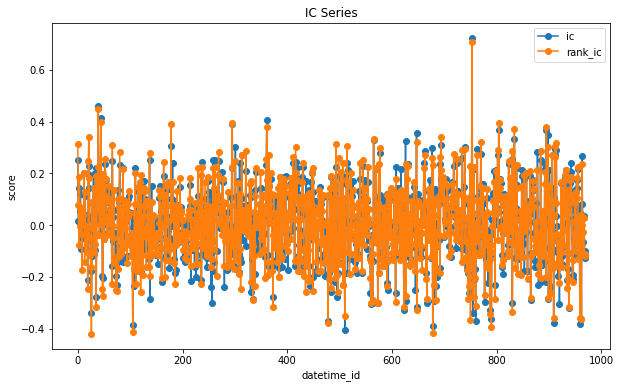

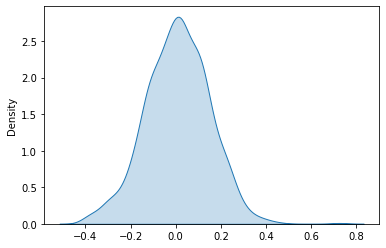

ic= 0.00807325556142112 icir= 0.056848805226804834 rank_ic= 0.006178716992150488 rank_icir= 0.04227453330282033


0.009377806991719913

In [23]:
ic, icir, rank_ic, rank_icir = q.ic_ana(pred["predict"], y_test, groupby='datetime')
print('ic=', ic, 'icir=', icir, 'rank_ic=', rank_ic, 'rank_icir=', rank_icir)
# 使用pearson相关系数评判拟合优度
r = q.pearson_corr(pred["predict"].values, y_test)
r

查看y_test和predict的分布和分布差异

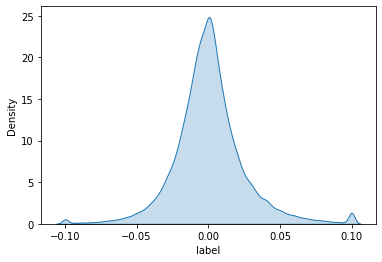

In [24]:
q.show_dist(y_test)

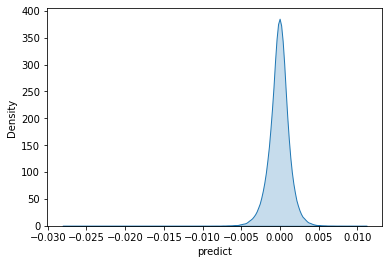

In [25]:
q.show_dist(pred["predict"])

回测

In [26]:
from scutquant import executor, report

# 将预测值处理成回测需要的格式
# pred = executor.prepare(pred, df_test, price='close', volume='vol')
pred = executor.prepare(pred, df_test, price='mean_price', volume='vol')
pred

predict       price     volume
time       code                                      
2019-01-02 000001.SZ  0.000858    9.252048  539386.32
           000002.SZ  0.000205   24.120738  247010.28
           000063.SZ -0.001175   19.088275  649682.72
           000069.SZ -0.001483    5.999183  403924.79
           000100.SZ -0.000639    2.515065  890514.27
...                        ...         ...        ...
2022-12-27 688363.SH -0.002355  136.312691   67620.51
           688396.SH -0.000423   53.127821   22894.05
           688561.SH -0.000777   65.791178   17585.16
           688599.SH -0.001777   62.192181  170829.80
           688981.SH -0.000210   41.078327   61293.26

[281386 rows x 3 columns]

Accuracy of Prediction: 0.5283347430220409


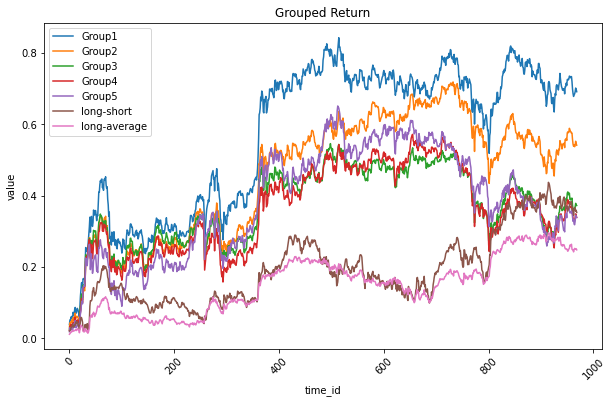

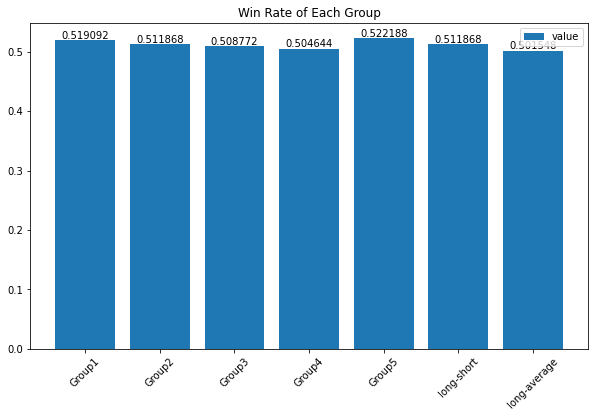

In [27]:
report.group_return_ana(pred, y_test)

In [28]:
backtest = {
    "generator": {
        "mode": "generate"
    },
    "strategy": {
        "class": "StrictTopKStrategy",  # 做多预测值前20%且值大于0%的股票, 做空后20%且值小于0%的股票. 自动平仓
        "kwargs": {
            "buy": 0,  
            "sell": -0,
            "auto_offset": True,
            "offset_freq": 2, # 应为delta_t + 1, 例如目标值是close_-2 / close_-1 - 1, 则delta_t = 1
            "buy_only": False,  # =True时，只做多不做空(在A股做空有一定的难度)
            "risk_degree": 0.95,  # 将风险度控制在这个数，如果超过了就按比例减持股票直到风险度小于等于它为止
            "unit": None,  # 由于数据已经是以手为单位, 故无需二次处理
            "max_volume": 0.35  # 手数随可用资金而改变，最大不会超过股票当天成交量的x%(例如T+1时下单，下单手数不会超过T时成交量的x%)
        }
    },
    "account": None,  # 使用默认账户, 即初始资金为1亿, 无底仓
    "trade_params": {
        "cost_buy": 0.0015,  # 佣金加上印花税
        "cost_sell": 0.0005,  
        "min_cost": 5,
    }
}
generator, strategy, account, trade_params = backtest["generator"], backtest["strategy"], backtest["account"], backtest["trade_params"]
exe = executor.Executor(generator, strategy, account, trade_params)
exe.execute(data=pred, verbose=0)

E(r): 0.2687696811351496
std: 0.16526028587882904
E(r_benchmark): 0.4145573363202267
std_benchmark: 0.1728743456410088 

Cumulative Rate of Return: 0.4901829513629481
Cumulative Rate of Return(benchmark): 0.33958556303554865
Cumulative Excess Rate of Return: 0.15059738832739944 

Max Drawdown: -0.04249453760748212
Max Drawdown(benchmark): -0.5462600364770351 

Sharpe Ratio: 1.625844273023543
Sortino Ratio: -0.9862786954560657
Information Ratio: -0.8821699321757828 

Pearson Correlation Coefficient Between Return and Benchmark: 0.6559608697288539
Profitable Days(%): 0.18472652218782248


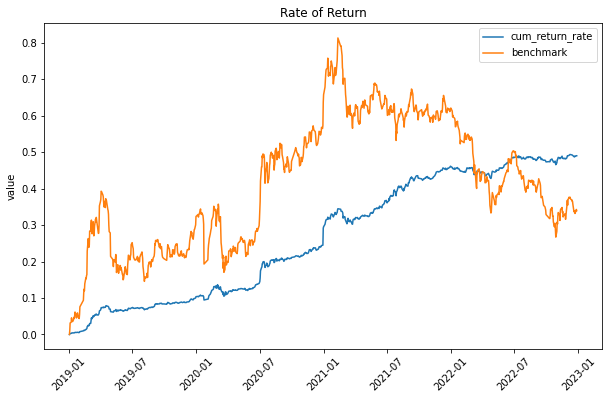

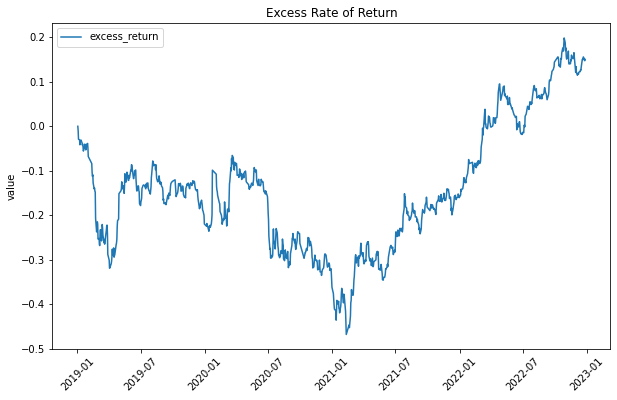

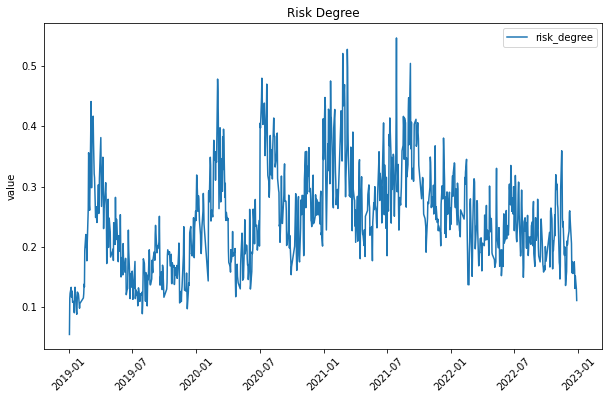

In [29]:
user_account, benchmark = exe.user_account, exe.benchmark
report.report_all(user_account, benchmark, freq=365, time=exe.time)  # 无风险收益率默认为年化3%，可以通过参数rf调节